<a href="https://colab.research.google.com/github/jetsonmom/yolov5/blob/main/yolov5_learning_example_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**<h1> 구글 드라이브 연동 </h1>**
구글 드라이브와 연동하여 사용하면 이후에 다시 프로젝트를 로드할 때 편합니다.

In [1]:
# prompt: 구글 드라이브랑 연결

from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive

Mounted at /content/drive
/content/drive/MyDrive


In [ ]:
%pwd

'/content/drive/MyDrive'

**<h1>yolov5 설치</h1>**
yolov5 깃 서버에 접속하여 다운로드하고
Requirements.txt파일로 필요한 라이브러리들을 일괄 설치하는 과정입니다.

In [2]:
# 기존에 설치를 완료한 경우에는 해당 경로로 이동만 하면 됩니다.
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [3]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

Cloning into 'yolov5'...
remote: Enumerating objects: 16625, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 16625 (delta 58), reused 66 (delta 30), pack-reused 16522
Receiving objects: 100% (16625/16625), 15.15 MiB | 14.01 MiB/s, done.
Resolving deltas: 100% (11411/11411), done.
/content/drive/MyDrive/yolov5/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 50.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 40.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 73.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the

**<h1>이미지 파일 관리</h1>**
이미지 파일을 관리하기 위한 폴더를 생성합니다.

In [4]:
!mkdir -p Train/labels
!mkdir -p Train/images

라벨 폴더와 이미지 폴더를 만든 후 yolov5 폴더를 선택하여 각각의 폴더에 이미지를 넣습니다.

그 후 yolov5 폴더에 가이드와 함께 제공된 **yolov5n.pt** 파일과 라벨링한 class의 이름에 맞게 수정한 **data.yaml** 파일을 넣습니다.

**<h1>yolov5 모델 학습 시작</h1>**

In [5]:
#필요 라이브러리 임포트하기
import torch
import os
from IPython.display import Image, clear_output  # to display images

In [ ]:
!rm /content/drive/MyDrive/yolov5/Train/labels.cache

In [10]:
#모델 학습하기
!python train.py  --img 512 --batch 16 --epochs 20 --data /content/drive/MyDrive/yolov5/data.yaml --weights yolov5n.pt --cache

2024-05-28 02:32:51.317712: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 02:32:51.317764: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 02:32:51.319073: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5n.pt, cfg=, data=/content/drive/MyDrive/yolov5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=F

데이터 지우는 코드

In [13]:

import os

# 삭제할 파일들이 있는 디렉토리 경로 설정
directory = '/content/drive/MyDrive/yolov5/Train/labels'

# 디렉토리 내의 모든 파일을 반복하면서 'frame_'로 시작하는 파일 찾기
for filename in os.listdir(directory):
    if filename.startswith('0000'):  # 'frame_'로 시작하는 파일 이름 조건 검사
        file_path = os.path.join(directory, filename)  # 삭제할 파일의 전체 경로 생성
        os.remove(file_path)  # 파일 삭제
        print(f'Deleted {file_path}')  # 삭제된 파일의 경로 출력


Deleted /content/drive/MyDrive/yolov5/Train/labels/00000135.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000134.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000069.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000100.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000099.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000103.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000169.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000101.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000136.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000102.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000168.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000068.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000067.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000066.txt
Deleted /content/drive/MyDrive/yolov5/Train/labels/00000034.txt
Deleted /content/drive/MyDrive/yolov5/Tr

**<h1>yolov5 모델 학습 결과 검증</h1>**

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 512 --conf 0.1 --source /content/drive/MyDrive/yolov5/Train/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/yolov5/Train/images, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-256-g43c43d8 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 1765930 parameters, 0 gradients, 4.1 GFLOPs
image 1/111 /content/drive/MyDrive/yolov5/Train/images/apple_fuji_L_1-35_5DI90.png: 512x512 1 apple, 5.6ms
image 2/111 /content/drive/MyDrive/yolov5/Train/images/apple_fuji_L_1-36_1TOP.png: 512x512 1 apple, 11.4ms
image 3/111 /content/drive/MyDrive/yolov5/Train/images/apple_fuji_L_1-37_2FR45.png: 512x512 1 a

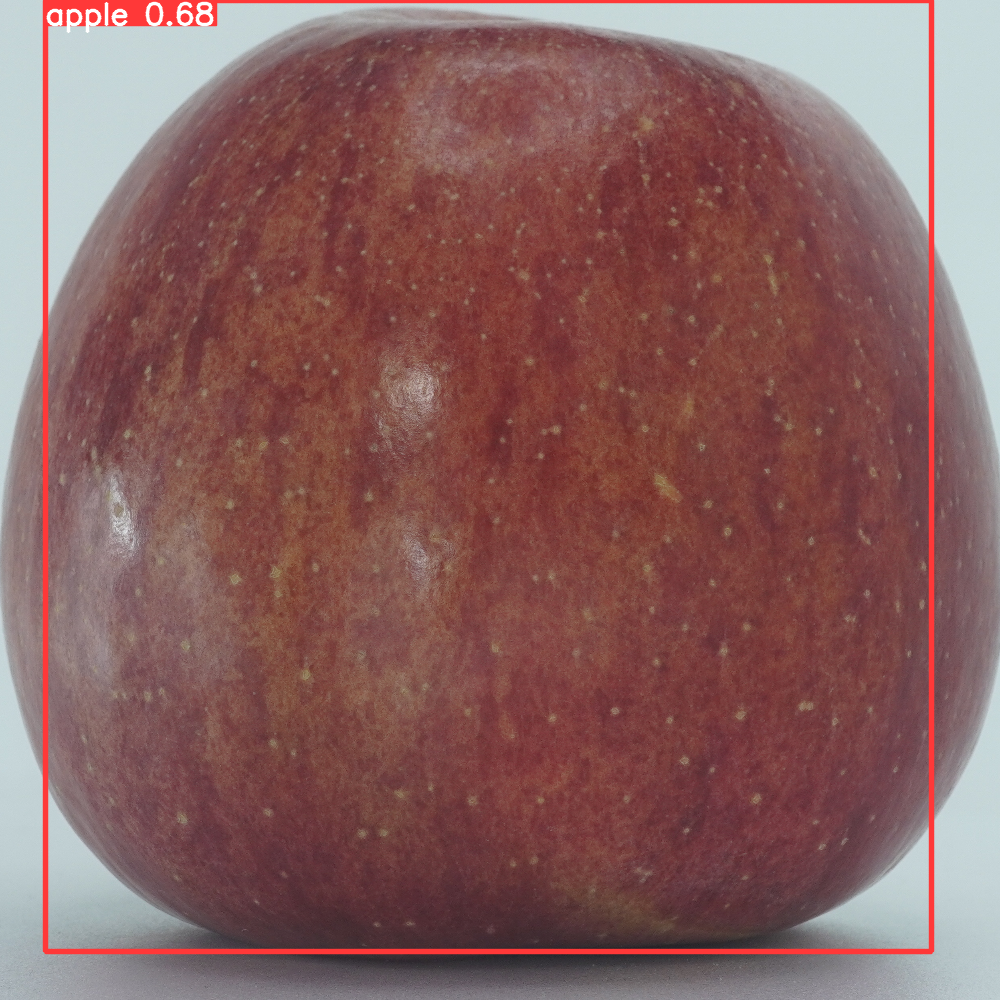

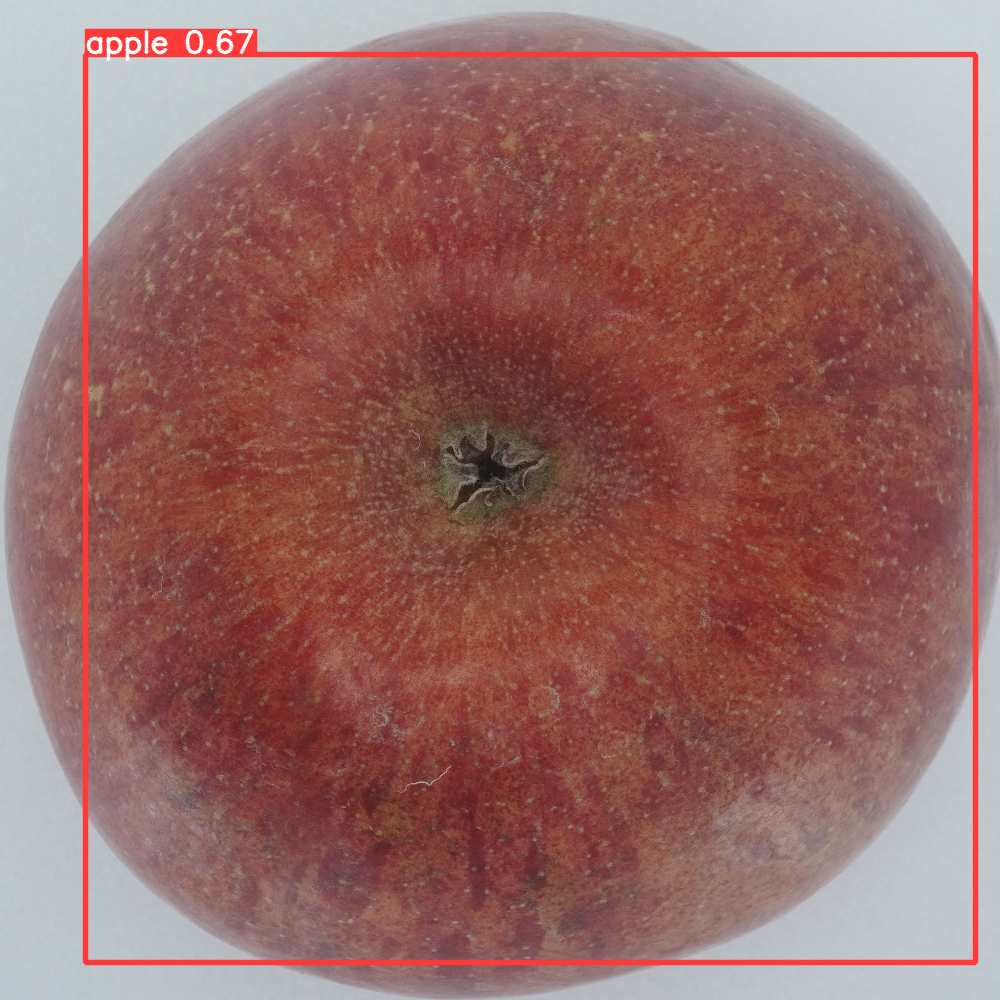

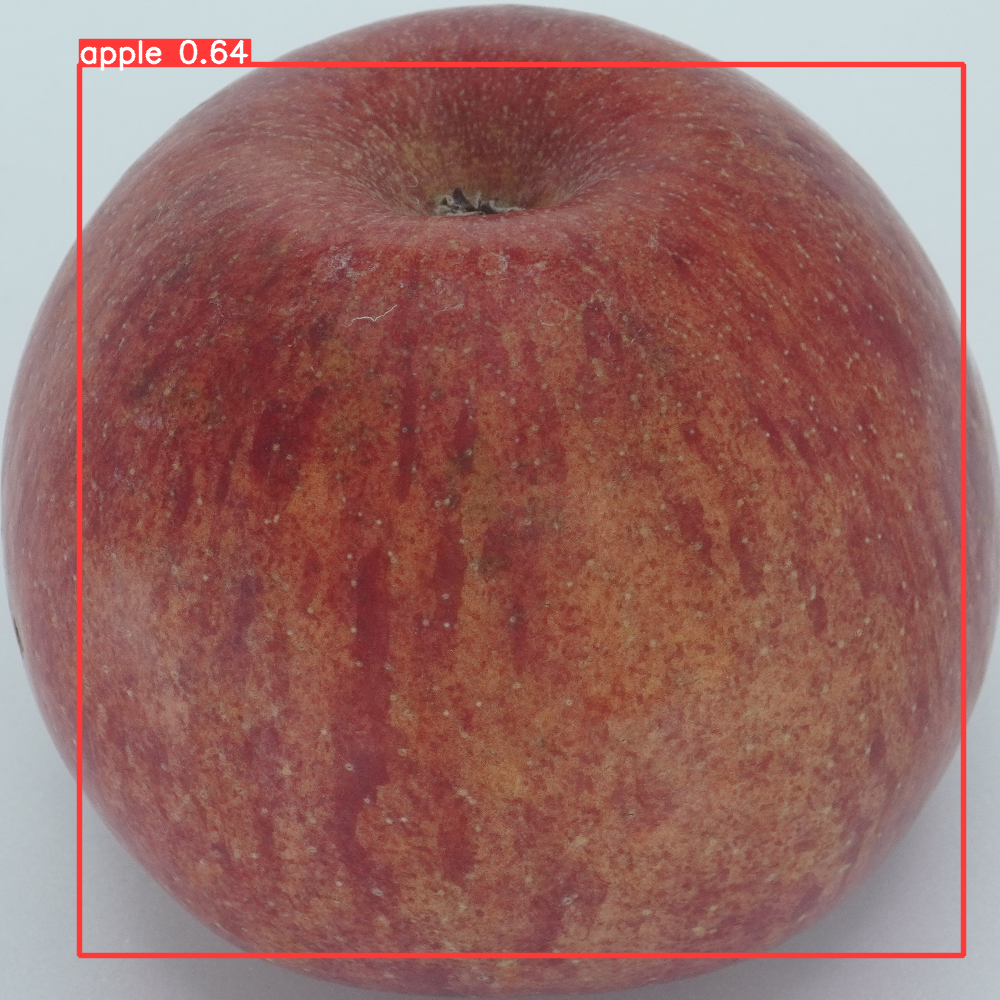

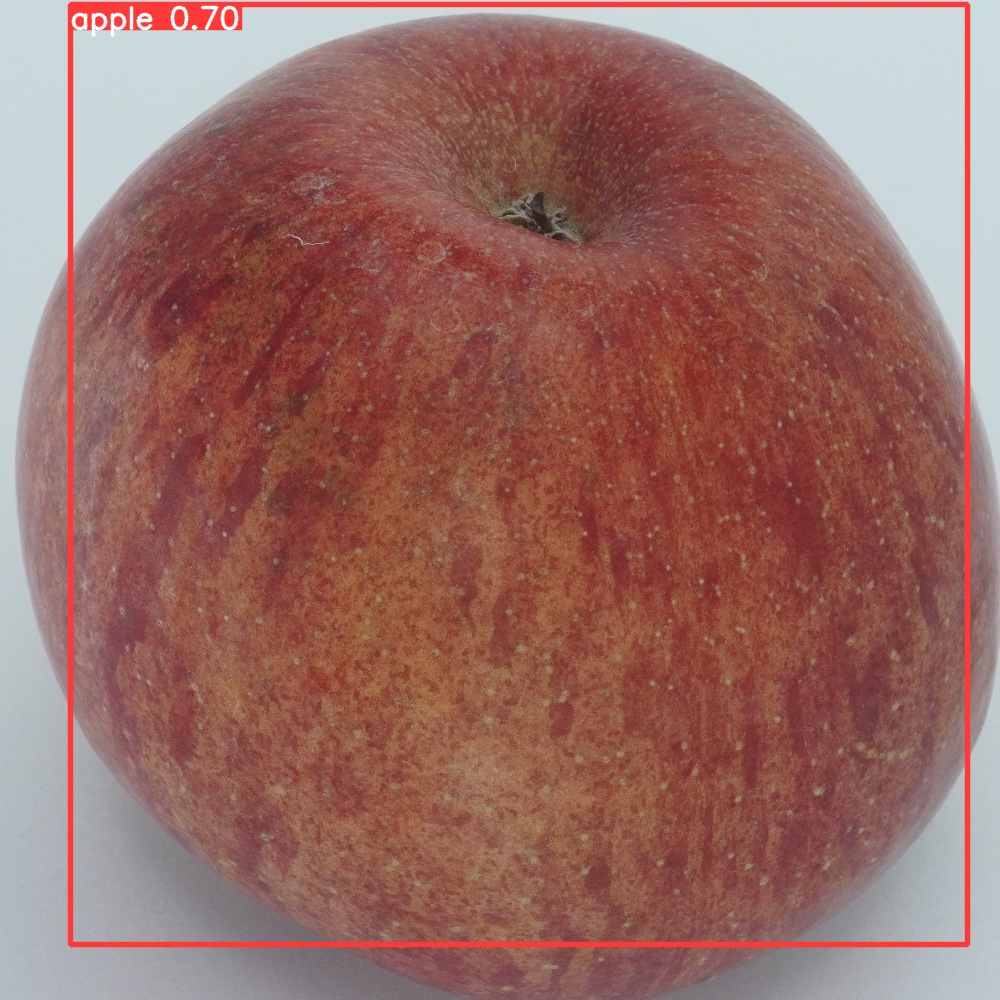

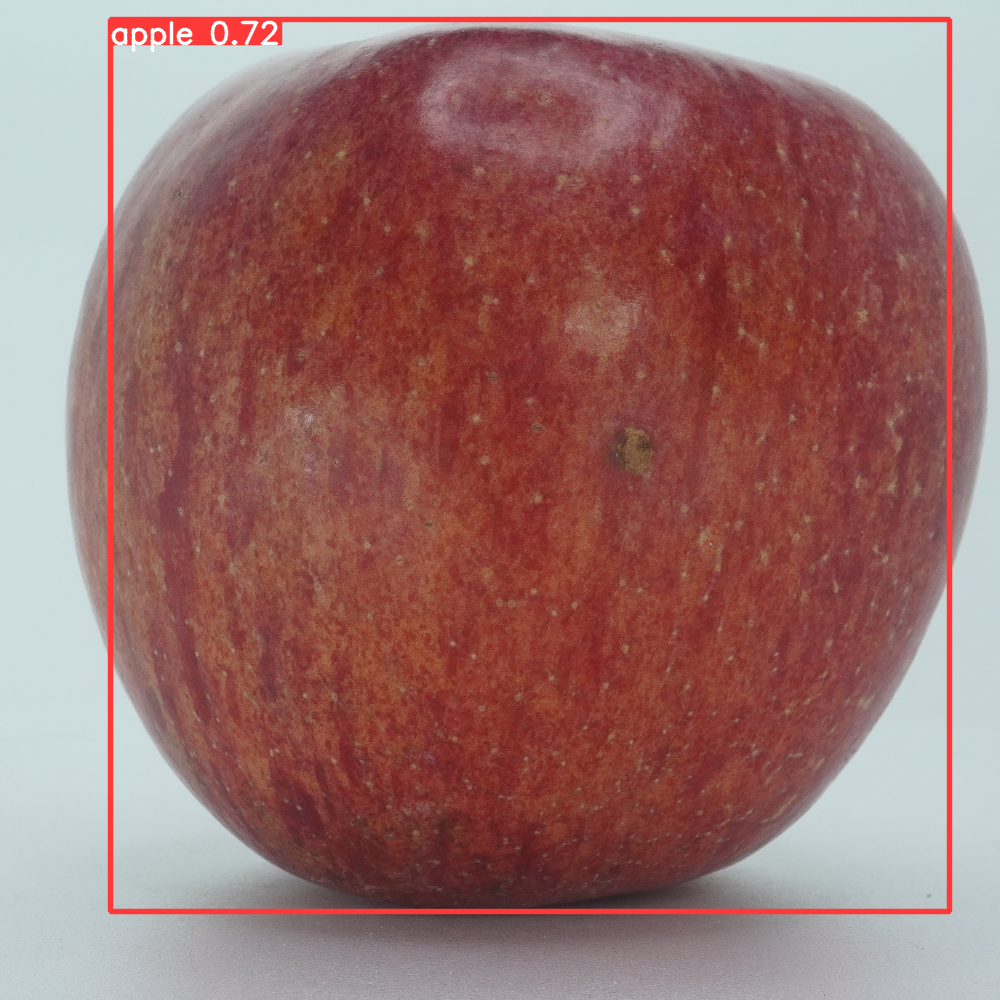

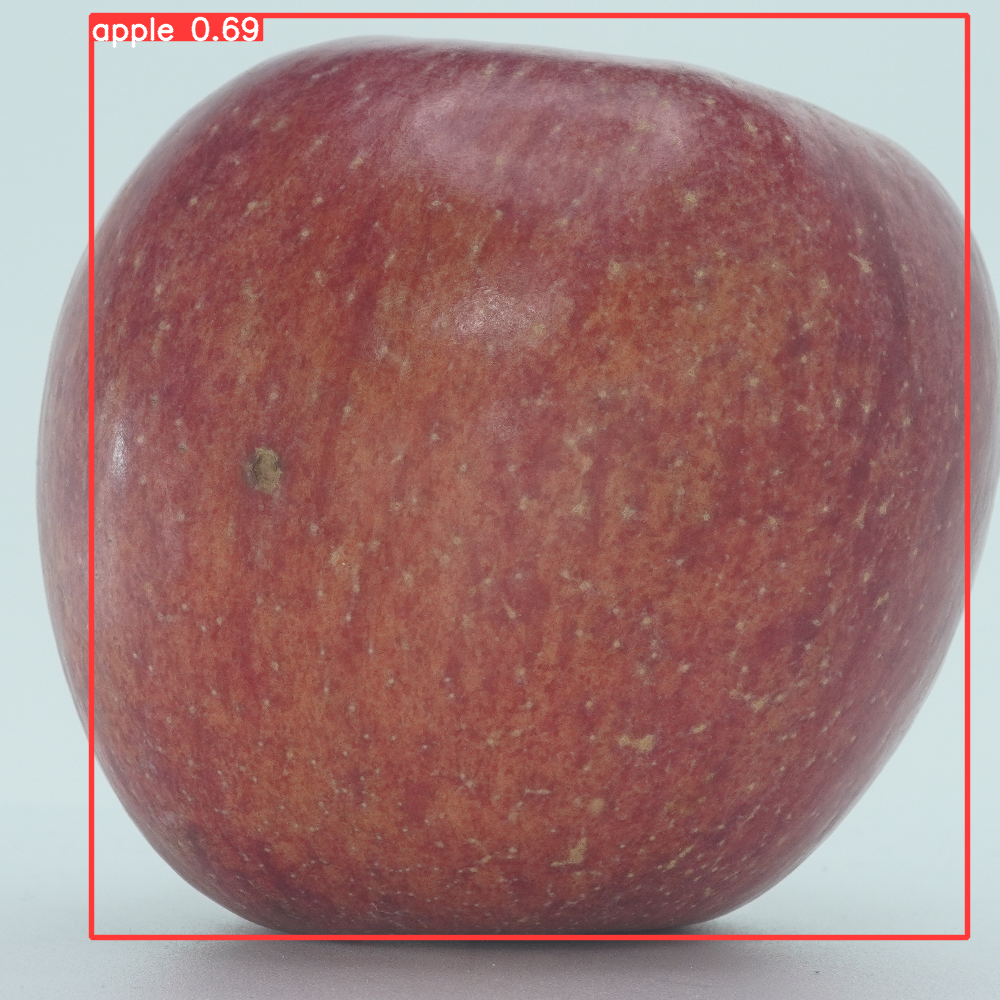

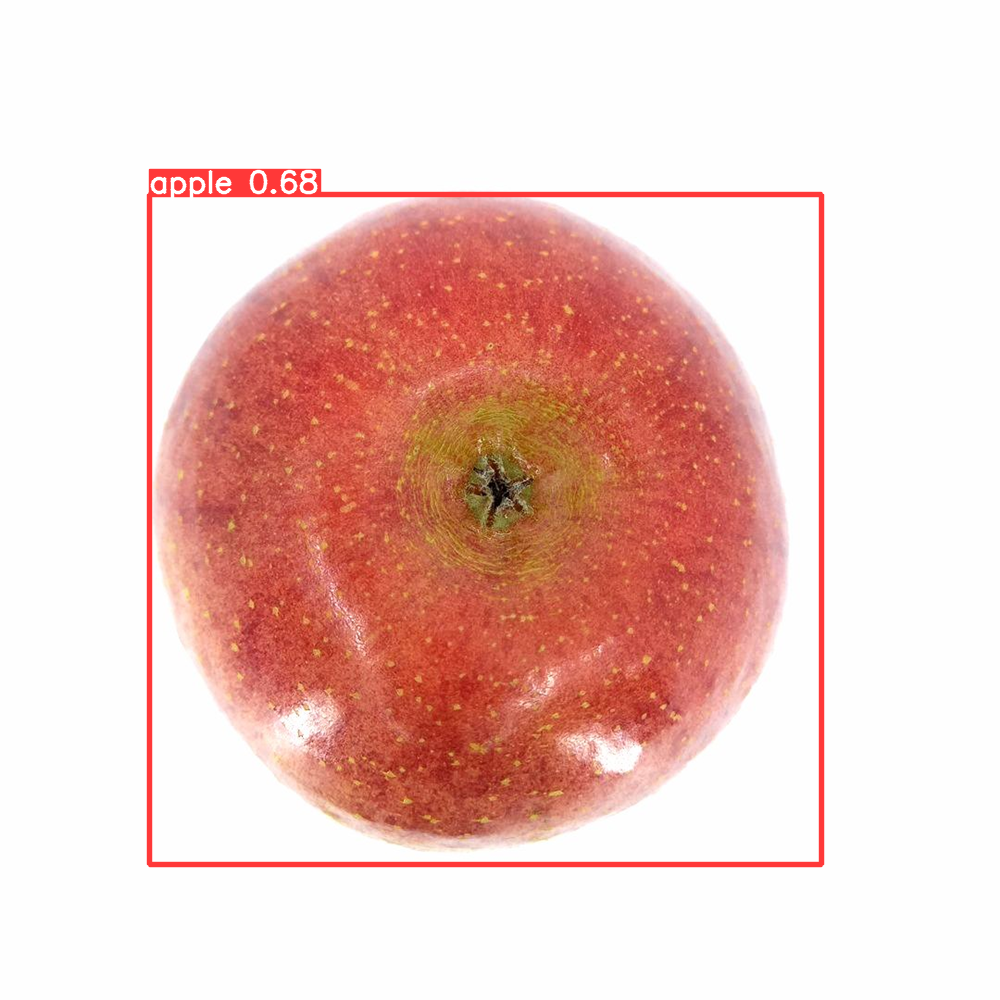

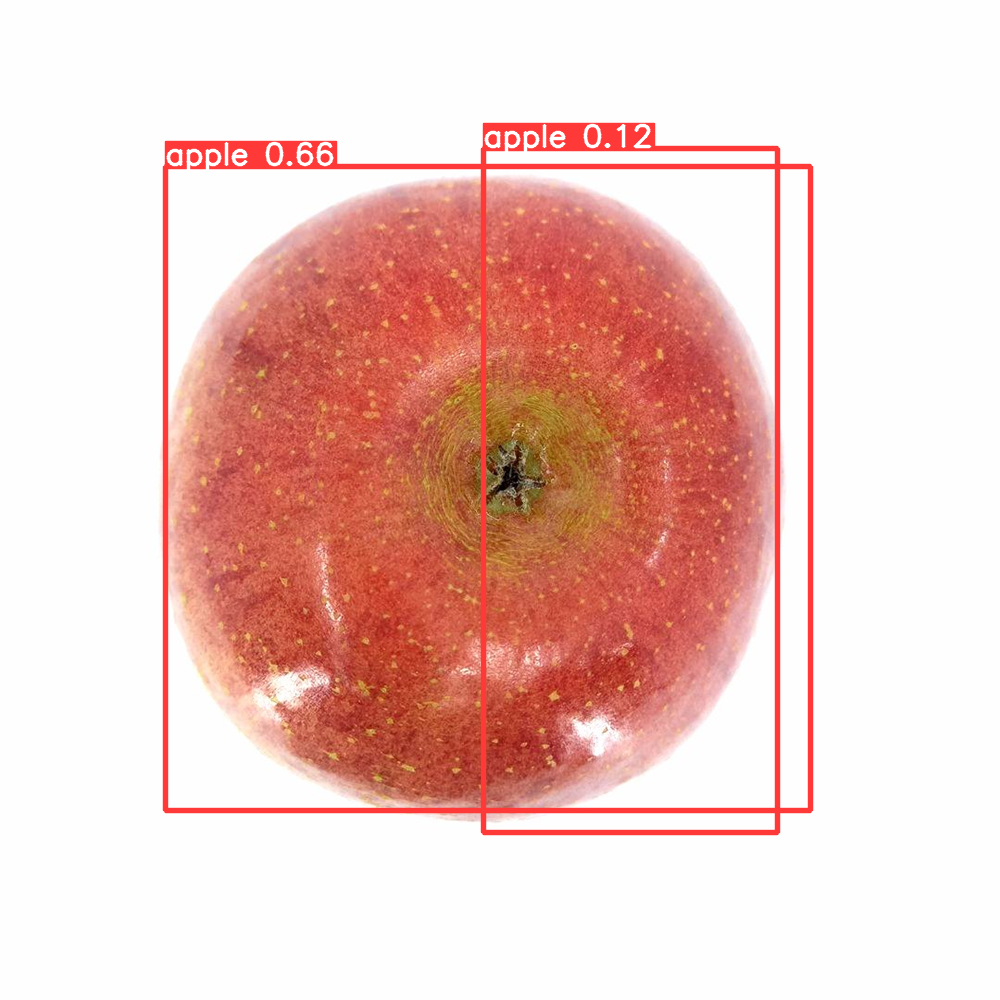

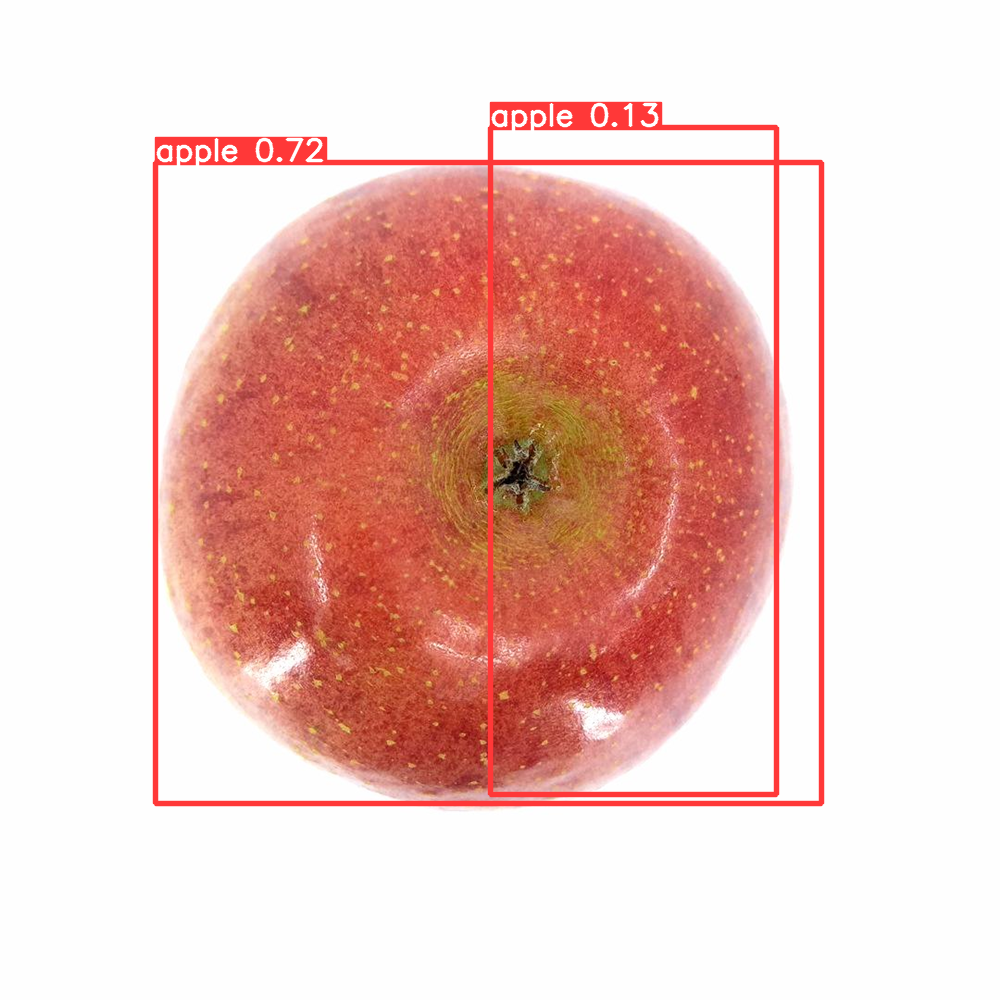

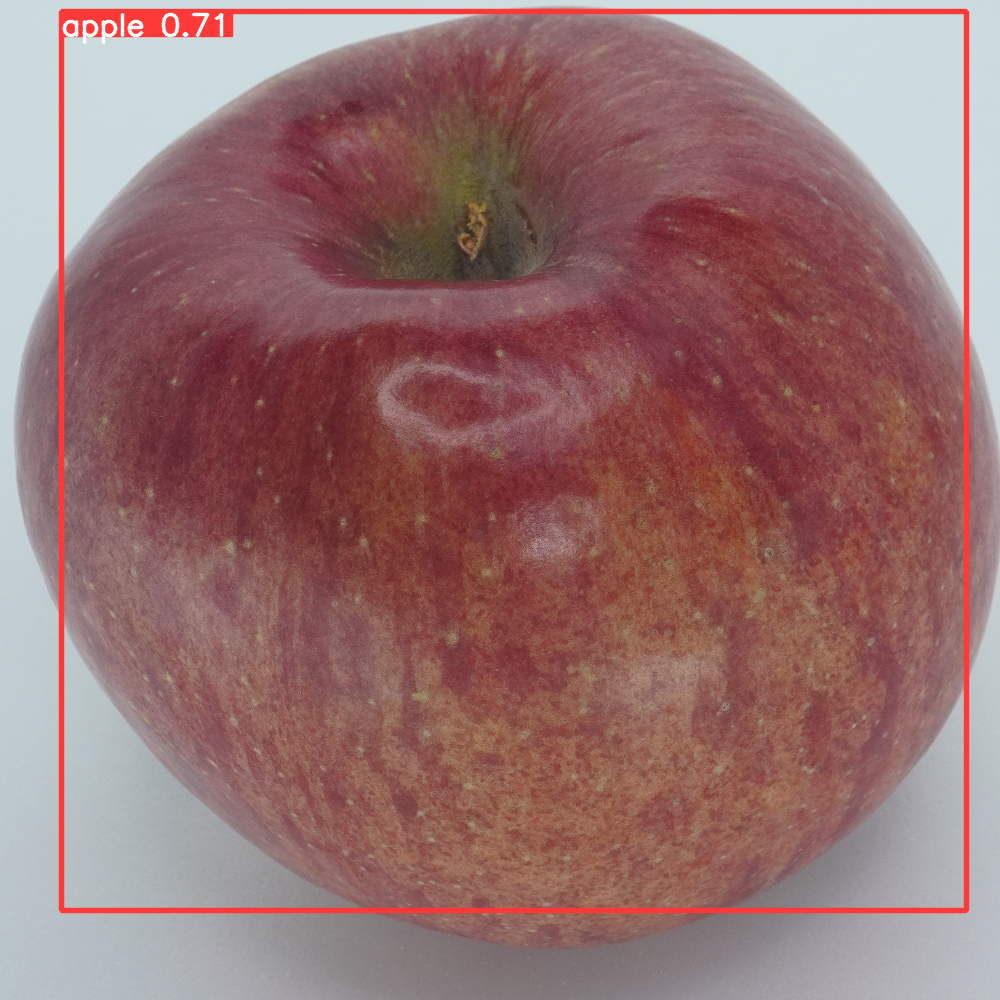

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp/*.png')[:10]: #이미지 파일 형식에 맞춰 .png 또는 .jpg 등으로 수정
    display(Image(filename=imageName))
    print("\n")

**<h1>onnx 파싱</h1>**

In [ ]:
!python export.py --img 512 --weights 'runs/train/exp/weights/best.pt' --include torchscript onnx

export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[512], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-256-g43c43d8 Python-3.10.12 torch-2.1.0+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 1765930 parameters, 0 gradients, 4.1 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 16128, 10) (3.7 MB)

TorchScript: starting export with torch 2.1.0+cu121...
TorchScript: export success ✅ 1.4s, saved as runs/train/exp/weights/best.torchscript (7.1 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 76.2 MB/s eta 0:00:00

requirements: AutoUpdate s